<div style="text-align: center; font-family: Arial, sans-serif;">
    <h1>
        <a href="https://www.kaggle.com/api/v1/datasets/download/imbikramsaha/food11" target="_blank" style="text-decoration: none; color: #2a7ae2;">
            FoodVision: Classifying 11 Food Categories
        </a>
    </h1>
    <h3>
        A TensorFlow Project from
        <a href="https://www.kaggle.com/datasets/imbikramsaha/food11" target="_blank" style="text-decoration: none; color: #2a7ae2;">
            Kaggle
        </a>
    </h3>
    <h4>By Mohammad Nourbakhsh Marvast</h4>
</div>

# Imports

In [1]:
# ========== Standard Library ==========
import os
import shutil
import requests

# ========== Third-Party Libraries ==========
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics

# ========== TensorFlow ==========
import tensorflow as tf


# Loading Data

In [2]:
!wget -O tensorflow_image_helper.py https://raw.githubusercontent.com/MNMMOoN/Data_Science/refs/heads/main/projects/tensorflow_image_helper.py

--2025-05-21 16:00:37--  https://raw.githubusercontent.com/MNMMOoN/Data_Science/refs/heads/main/projects/tensorflow_image_helper.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18740 (18K) [text/plain]
Saving to: ‘tensorflow_image_helper.py’

tensorflow_image_he 100%[===================>]  18.30K  --.-KB/s    in 0.001s  

2025-05-21 16:00:37 (24.2 MB/s) - ‘tensorflow_image_helper.py’ saved [18740/18740]



In [3]:
from tensorflow_image_helper import Load_Image_Data_with_URL, RandomPlot, ModelCallbacks, Evaluation

In [4]:
loading = Load_Image_Data_with_URL('https://www.kaggle.com/api/v1/datasets/download/imbikramsaha/food11', rescale= False)
loading.extract_data()

Creating directory 'food11'...
Extracting 'food11.zip' to 'food11'...
Removing zip file 'food11.zip'...

Loading train data...
Found 9900 files belonging to 11 classes.
Using 7920 files for training.

Loading validation data...
Found 9900 files belonging to 11 classes.
Using 1980 files for validation.

Loading test data...
Found 1100 files belonging to 11 classes.

Data loading complete


In [5]:
train_data = loading.train_data
val_data = loading.val_data
test_data = loading.test_data
class_names = loading.class_names

# Visualize! Visualize! Visualize!

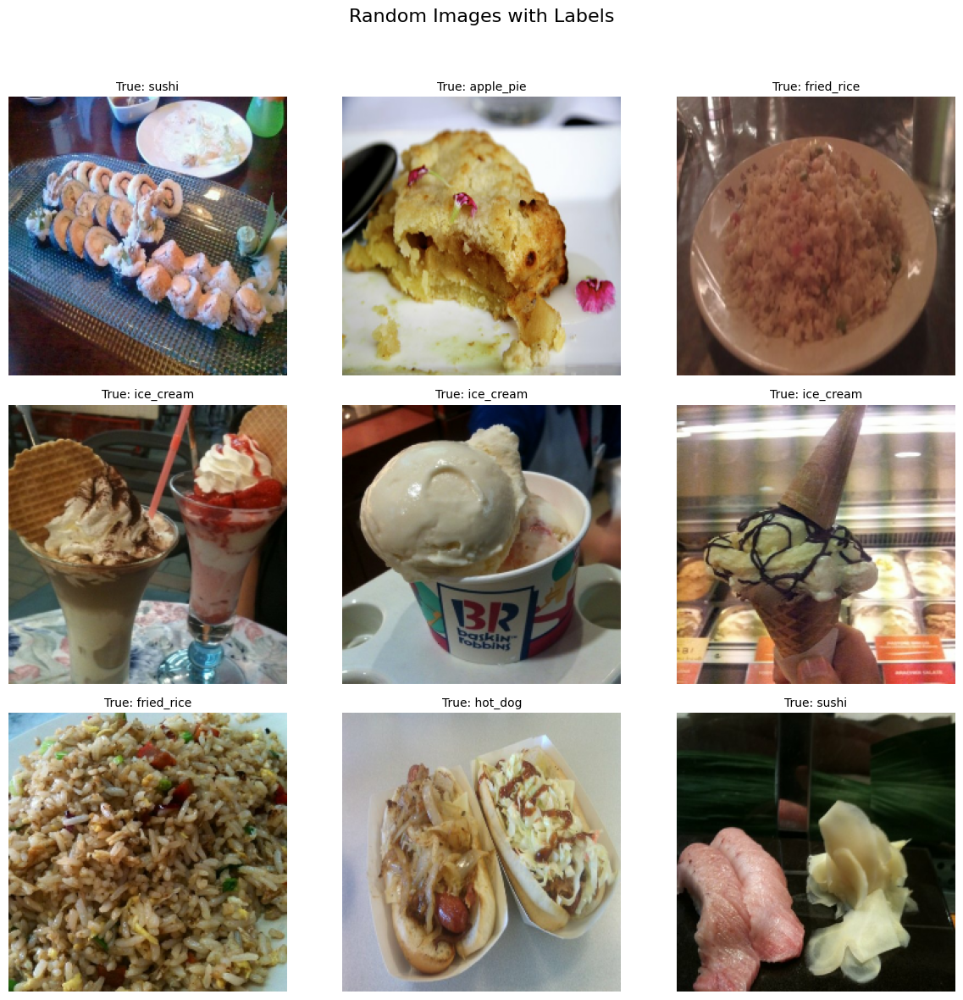

In [6]:
RandomPlot(train_data, class_names, num_images= 9)

# EfficientnetB0

## Model Designing

In [7]:
# 1. Create the Base Model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# 2. Create the Input Layer
inputs = tf.keras.layers.Input(shape= (224, 224, 3), name='input_layer')

# 3. Pass Inputs to the Base Model
x = base_model(inputs)

# 4. Using Avg Pooling
x = tf.keras.layers.GlobalAveragePooling2D(name='global_average_pooling_layer')(x)

# 5. Create the Output Layer
outputs = tf.keras.layers.Dense(11, activation='softmax', name='output_layer')(x)

# 6. Create the Model
model_EfficientNetB0 = tf.keras.Model(inputs, outputs)

# 7. Compile the Model
model_EfficientNetB0.compile(loss='categorical_crossentropy',
                             optimizer=tf.keras.optimizers.Adam(),
                             metrics=['accuracy'])

# 8. Using Callbacks
callbacks = ModelCallbacks() # From tensorflow_image_helper.ipynb
tensorboard_dir_name = 'TensorBoard'
tensorboard_experiment_name = 'EfficientNetB0'
callbacks.tensorboard(dir_name= tensorboard_dir_name,
                      experiment_name= tensorboard_experiment_name)
callbacks.early_stopping()

# 8. Fitting the Data
history_EfficientNetB0 = model_EfficientNetB0.fit(train_data,
                                                  epochs= 7,
                                                  steps_per_epoch= len(train_data),
                                                  validation_data= val_data,
                                                  validation_steps= len(val_data),
                                                  callbacks= callbacks.get_callbacks()
                                                  )

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
[TensorBoard] Log files will be saved to: TensorBoard/EfficientNetB0/20250521-160058
[EarlyStopping] Will stop if no improvement in 'val_loss' for 5 epochs.
Epoch 1/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 68s 185ms/step - accuracy: 0.6309 - loss: 1.2611 - val_accuracy: 0.8515 - val_loss: 0.5268
Epoch 2/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.8506 - loss: 0.4962 - val_accuracy: 0.8606 - val_loss: 0.4606
Epoch 3/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.8775 - loss: 0.4071 - val_accuracy: 0.8672 - val_loss: 0.4338
Epoch 4/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - accuracy: 0.8919 - loss: 0.3639 - val_accuracy: 0.8712 - val_loss: 0.4174
Epoch 5/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9014 - loss: 0.3311 - val_accuracy: 0.8753 - val_loss: 0.4072
Epoch 6/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9104 - loss: 0.3068 - val_accuracy: 0.8768 - val_loss: 0.4082
Epoch 7/7
248/248

In [8]:
eval = Evaluation(model_EfficientNetB0, test_data, class_names, history= history_EfficientNetB0)

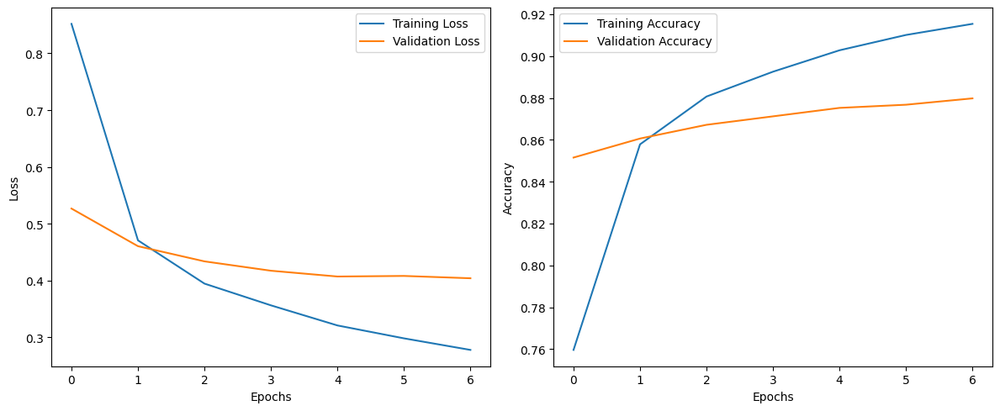

In [9]:
eval.plot_val_eval()

[INFO] Extracting ground truth labels...
[INFO] Making predictions...

Model Evaluation

Classification Report
               precision    recall  f1-score   support

    apple_pie       0.84      0.76      0.80       100
   cheesecake       0.88      0.91      0.90       100
chicken_curry       0.79      0.87      0.83       100
 french_fries       0.95      0.87      0.91       100
   fried_rice       0.94      0.85      0.89       100
    hamburger       0.95      0.90      0.92       100
      hot_dog       0.83      0.94      0.88       100
    ice_cream       0.91      0.86      0.88       100
     omelette       0.78      0.86      0.82       100
        pizza       0.96      0.95      0.95       100
        sushi       0.87      0.89      0.88       100

     accuracy                           0.88      1100
    macro avg       0.88      0.88      0.88      1100
 weighted avg       0.88      0.88      0.88      1100


Confusion Matrix


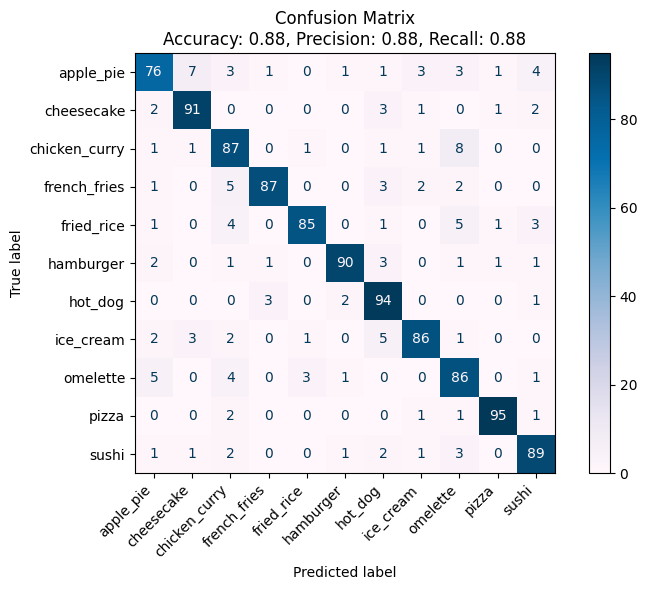

In [10]:
eval.plot_test_eval()

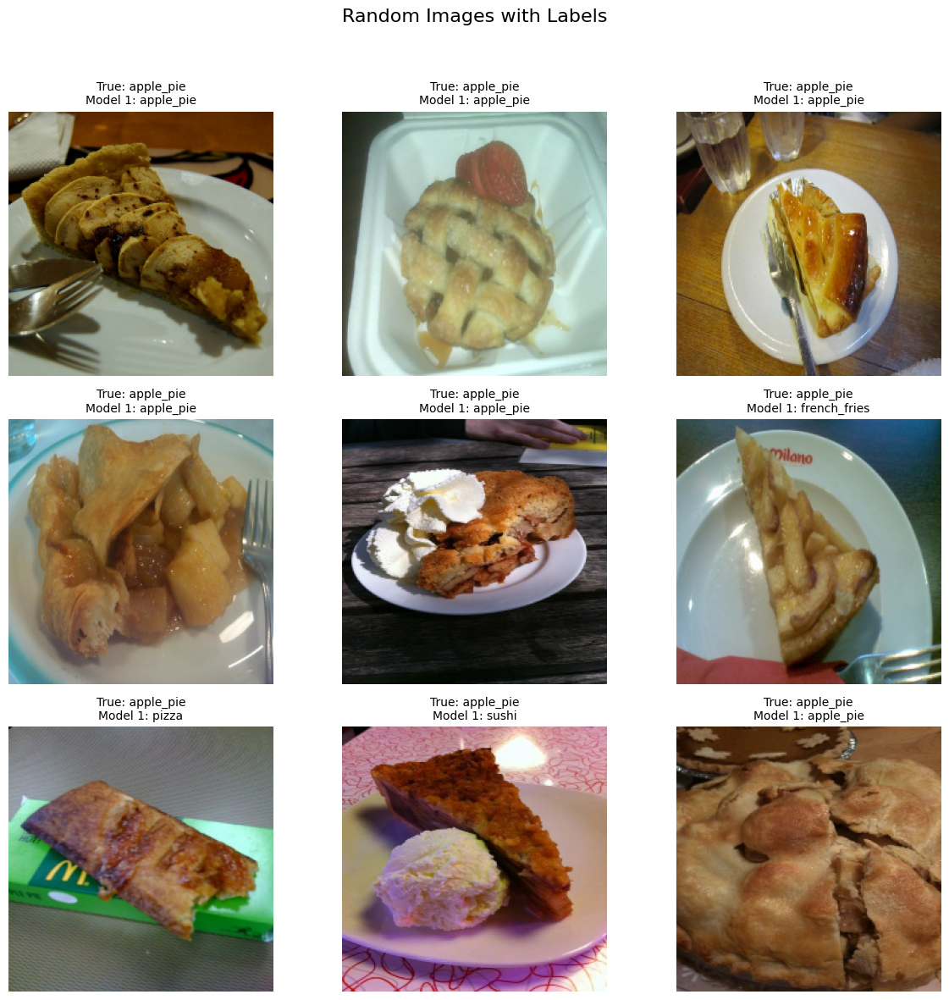

In [11]:
RandomPlot(dataset= test_data,
           class_names= class_names,
           models= [model_EfficientNetB0],
           num_images=9)

# Putting All our Codes into One Place

In [12]:
class Model_with_BaseModel:
    """
    A class to build, compile, train, and evaluate a model based on a given base model (e.g., EfficientNetB0).

    Attributes:
        base_model (tf.keras.Model): A pre-trained base model without the top layer.
        input_shape (tuple): The shape of the input image, e.g., (224, 224, 3).
        output_shape (int): Number of output classes.
        model (tf.keras.Model): The final compiled model.
        history (History): Training history after model.fit().
        callbacks (ModelCallbacks): An instance of custom callbacks.
    """

    def __init__(self, base_model, input_shape, output_shape, verbose=True):
        """
        Initializes the model pipeline.

        Args:
            base_model (tf.keras.Model): A pre-trained model like EfficientNetB0 with include_top=False.
            input_shape (tuple): Input shape for the model.
            output_shape (int): Number of output classes.
            verbose (bool): Whether to print model summary and info.
        """
        self.base_model = base_model
        self.base_model.trainable = False  # Freeze base model initially
        self.input_shape = input_shape
        self.output_shape = output_shape
        self.model = None
        self.history = None
        self.callbacks = None
        self.verbose = verbose

    def build_model(self):
        """
        Builds and compiles the full model using the base model.
        """

        augmentation = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=self.input_shape),
            tf.keras.layers.RandomFlip("horizontal"),
            tf.keras.layers.RandomFlip("vertical"),
            tf.keras.layers.RandomRotation(0.2),
            tf.keras.layers.RandomZoom(0.2),
            tf.keras.layers.RandomTranslation(0.2, 0.2)
        ], name="augmentation")

        inputs = tf.keras.layers.Input(shape=self.input_shape, name="input_layer")
        x = augmentation(inputs)
        x = self.base_model(inputs, training=False)
        x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
        outputs = tf.keras.layers.Dense(self.output_shape, activation='softmax', name="output_layer")(x)

        self.model = tf.keras.Model(inputs, outputs, name="TransferLearningModel")
        self.model.compile(loss="categorical_crossentropy",
                           optimizer=tf.keras.optimizers.Adam(),
                           metrics=["accuracy"])

        if self.verbose:
            self.model.summary()
            print("Model compiled.\n\n")

    def setup_callbacks(self, dir_name="TensorBoard", experiment_name="Experiment"):
        """
        Initializes callbacks using ModelCallbacks class.

        Args:
            dir_name (str): Directory to store TensorBoard logs.
            experiment_name (str): Name of the experiment subdirectory.
        """
        self.callbacks = ModelCallbacks()
        self.callbacks.tensorboard(dir_name=dir_name, experiment_name=experiment_name)
        self.callbacks.early_stopping()
        if self.verbose:
            print("Callbacks initialized.")

    def train(self, train_data, val_data, epochs=10):
        """
        Trains the model.

        Args:
            train_data (tf.data.Dataset): Batched training dataset.
            val_data (tf.data.Dataset): Batched validation dataset.
            epochs (int): Number of training epochs.
        """
        if self.model is None:
            raise ValueError("Model not built. Call build_model() first.")

        if self.callbacks is None:
            self.setup_callbacks()

        self.history = self.model.fit(train_data,
                                      validation_data=val_data,
                                      epochs=epochs,
                                      steps_per_epoch=len(train_data),
                                      validation_steps=len(val_data),
                                      callbacks=self.callbacks.get_callbacks())
        if self.verbose:
            print("Training completed.")

    def evaluate(self, test_data, class_names, val_eval= False):
        """
        Evaluates the trained model using the Evaluation class.

        Args:
            test_data (tf.data.Dataset): Batched test dataset.
            class_names (list): List of class labels.
            val_eval (bool): Whether to evaluate on validation data. Default is False.
        """
        if self.model is None or self.history is None:
            raise ValueError("Model must be trained before evaluation.")

        eval = Evaluation(model=self.model,
                          test_data=test_data,
                          class_names=class_names,
                          history=self.history,
                          verbose=self.verbose)

        if val_eval:
            eval.plot_val_eval()

        eval.plot_test_eval()

    def plot_predictions(self, dataset, class_names, models = None, num_images=9):
        """
        Displays random image predictions.

        Args:
            dataset (tf.data.Dataset): Batched dataset to visualize predictions on.
            class_names (list): List of class labels.
            models (list): List of models to make predictions with. Default is an empty list.
            num_images (int): Number of images to display.
        """
        all_models = []  # Always include the base model

        if models:
            # Extract actual tf.keras.Model from wrapper classes if necessary
            extracted_models = []
            for m in models:
                if hasattr(m, 'model') and isinstance(m.model, tf.keras.Model):
                    extracted_models.append(m.model)
                elif isinstance(m, tf.keras.Model):
                    extracted_models.append(m)
                else:
                    raise TypeError(f"Unsupported model type: {type(m)}")
        all_models += extracted_models
        all_models.append(self.model)

        RandomPlot(dataset=dataset,
                  class_names=class_names,
                  models=all_models,
                  num_images=num_images)


# EfficientnetB1

In [13]:
# 1. Create the Base Model
base_model_2 = tf.keras.applications.EfficientNetB1(include_top=False)
base_model_2.trainable = False

# 2. Making The Class Object
model_EfficientNetB1 = Model_with_BaseModel(base_model= base_model_2,
                                            input_shape= (224, 224, 3),
                                            output_shape= 11,
                                            verbose= True)

# 3. Build Our Model
model_EfficientNetB1.build_model()

# 4. Setup Callbacks
model_EfficientNetB1.setup_callbacks(dir_name= 'TensorBoard',
                                     experiment_name= 'EfficientNetB1')

# 5. Training Our Model
model_EfficientNetB1.train(train_data, val_data, epochs= 7)

27018416/27018416 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "TransferLearningModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb1 (Functional)     │ (None, 7, 7, 1280)     │     6,575,239 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling_layer    │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 11)             │        14,091 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,589,330 (25.14 MB)

 Trainable params: 14,091 (55.04 KB)

 Non-trainable params: 6,575,239 (25.08 MB)

Model compiled.


[TensorBoard] Log files will be saved to: TensorBoard/EfficientNetB1/20250521-160435
[EarlyStopping] Will stop if no improvement in 'val_loss' for 5 epochs.
Callbacks initialized.
Epoch 1/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 78s 204ms/step - accuracy: 0.6459 - loss: 1.2157 - val_accuracy: 0.8414 - val_loss: 0.5155
Epoch 2/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.8526 - loss: 0.4710 - val_accuracy: 0.8571 - val_loss: 0.4534
Epoch 3/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 17s 69ms/step - accuracy: 0.8796 - loss: 0.3979 - val_accuracy: 0.8641 - val_loss: 0.4275
Epoch 4/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 21s 71ms/step - accuracy: 0.8908 - loss: 0.3529 - val_accuracy: 0.8727 - val_loss: 0.4097
Epoch 5/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 19s 77ms/step - accuracy: 0.9029 - loss: 0.3172 - val_accuracy: 0.8717 - val_loss: 0.4062
Epoch 6/7
248/248 ━━━━━━━━━━━━━━━━━━━━ 18s 72ms/step - accuracy: 0.9100 - loss: 0.2927 - val_accuracy: 0.8753 - val_loss: 0.4027
Epoch 7/7
248/248 ━━━━━━━━━

[INFO] Extracting ground truth labels...
[INFO] Making predictions...

Model Evaluation

Classification Report
               precision    recall  f1-score   support

    apple_pie       0.72      0.78      0.75       100
   cheesecake       0.91      0.84      0.88       100
chicken_curry       0.87      0.86      0.86       100
 french_fries       0.95      0.89      0.92       100
   fried_rice       0.91      0.88      0.89       100
    hamburger       0.90      0.88      0.89       100
      hot_dog       0.88      0.92      0.90       100
    ice_cream       0.83      0.87      0.85       100
     omelette       0.86      0.86      0.86       100
        pizza       0.92      0.97      0.95       100
        sushi       0.91      0.87      0.89       100

     accuracy                           0.87      1100
    macro avg       0.88      0.87      0.88      1100
 weighted avg       0.88      0.87      0.88      1100


Confusion Matrix


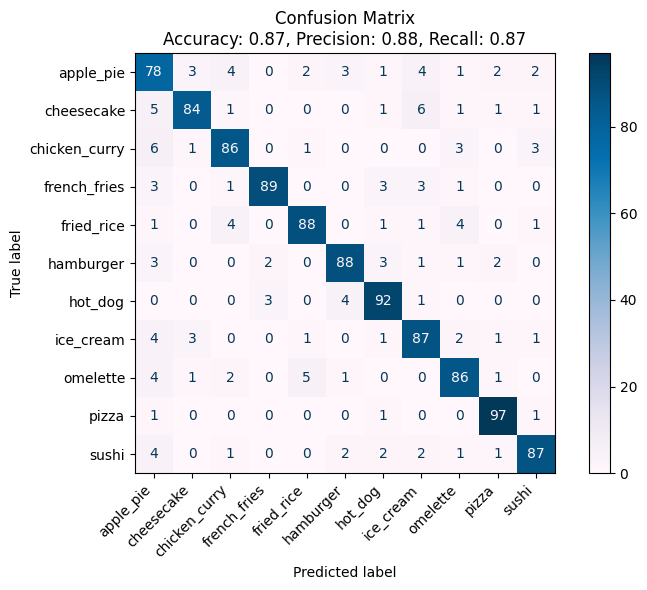

In [14]:
# 6. Evaluating Our Model
model_EfficientNetB1.evaluate(test_data, class_names)

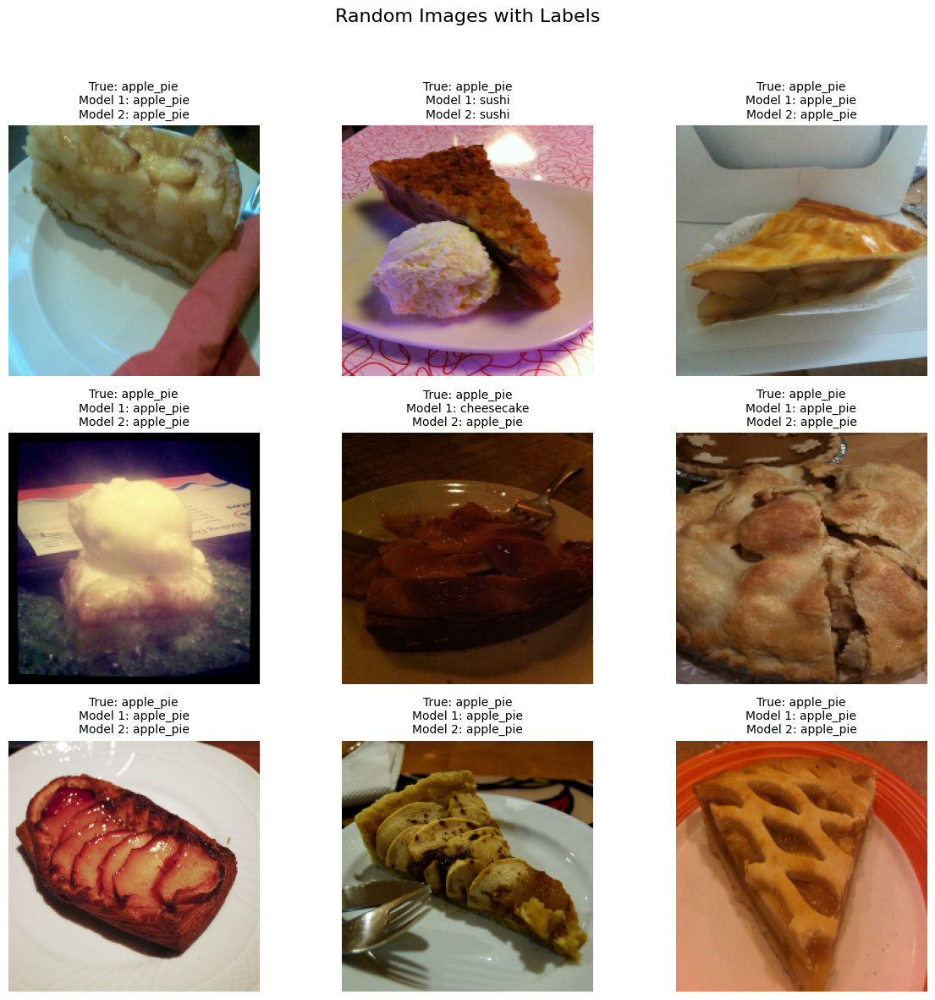

In [15]:
# 7. Plot RandomPLots
model_EfficientNetB1.plot_predictions(test_data, class_names, models=[model_EfficientNetB0], num_images= 9)

# EfficientnetB2

In [16]:
# 1. Create the Base Model
base_model_3 = tf.keras.applications.EfficientNetB1(include_top=False)
base_model_3.trainable = False

# 2. Making The Class Object
model_EfficientNetB2 = Model_with_BaseModel(base_model= base_model_3,
                                            input_shape= (224, 224, 3),
                                            output_shape= 11,
                                            verbose= True)

# 3. Build Our Model
model_EfficientNetB2.build_model()

# 4. Setup Callbacks
model_EfficientNetB2.setup_callbacks(dir_name= 'TensorBoard',
                                     experiment_name= 'EfficientNetB2')

# 5. Training Our Model
model_EfficientNetB2.train(train_data, val_data, epochs= 5)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "TransferLearningModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb1 (Functional)     │ (None, 7, 7, 1280)     │     6,575,239 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling_layer    │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 11)             │        14,091 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,589,330 (25.14 MB)

 Trainable params: 14,091 (55.04 KB)

 Non-trainable params: 6,575,239 (25.08 MB)

Model compiled.


[TensorBoard] Log files will be saved to: TensorBoard/EfficientNetB2/20250521-160820
[EarlyStopping] Will stop if no improvement in 'val_loss' for 5 epochs.
Callbacks initialized.
Epoch 1/5
248/248 ━━━━━━━━━━━━━━━━━━━━ 68s 165ms/step - accuracy: 0.6614 - loss: 1.2025 - val_accuracy: 0.8465 - val_loss: 0.5063
Epoch 2/5
248/248 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - accuracy: 0.8535 - loss: 0.4757 - val_accuracy: 0.8621 - val_loss: 0.4440
Epoch 3/5
248/248 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8721 - loss: 0.4036 - val_accuracy: 0.8707 - val_loss: 0.4191
Epoch 4/5
248/248 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - accuracy: 0.8948 - loss: 0.3505 - val_accuracy: 0.8737 - val_loss: 0.4057
Epoch 5/5
248/248 ━━━━━━━━━━━━━━━━━━━━ 18s 71ms/step - accuracy: 0.9000 - loss: 0.3244 - val_accuracy: 0.8732 - val_loss: 0.4010
Restoring model weights from the end of the best epoch: 5.
Training completed.


[INFO] Extracting ground truth labels...
[INFO] Making predictions...

Model Evaluation

Classification Report
               precision    recall  f1-score   support

    apple_pie       0.72      0.78      0.75       100
   cheesecake       0.91      0.84      0.88       100
chicken_curry       0.87      0.86      0.86       100
 french_fries       0.95      0.89      0.92       100
   fried_rice       0.91      0.88      0.89       100
    hamburger       0.90      0.88      0.89       100
      hot_dog       0.88      0.92      0.90       100
    ice_cream       0.83      0.87      0.85       100
     omelette       0.86      0.86      0.86       100
        pizza       0.92      0.97      0.95       100
        sushi       0.91      0.87      0.89       100

     accuracy                           0.87      1100
    macro avg       0.88      0.87      0.88      1100
 weighted avg       0.88      0.87      0.88      1100


Confusion Matrix


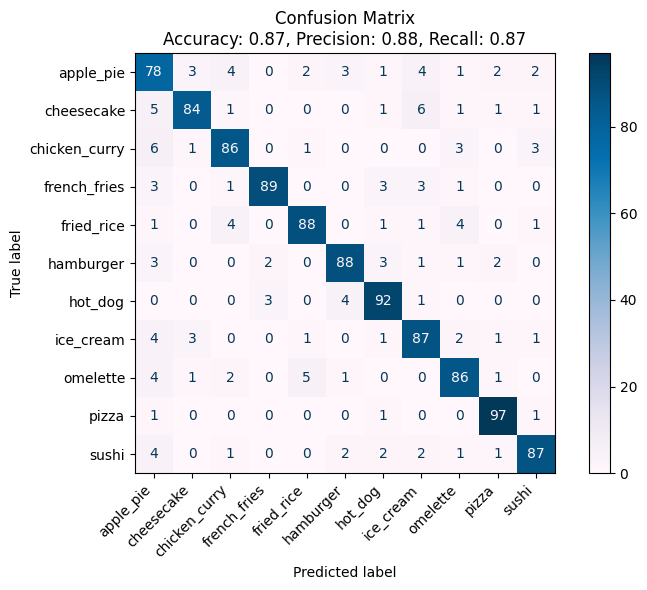

In [17]:
# 6. Evaluating Our Model
model_EfficientNetB1.evaluate(test_data, class_names)

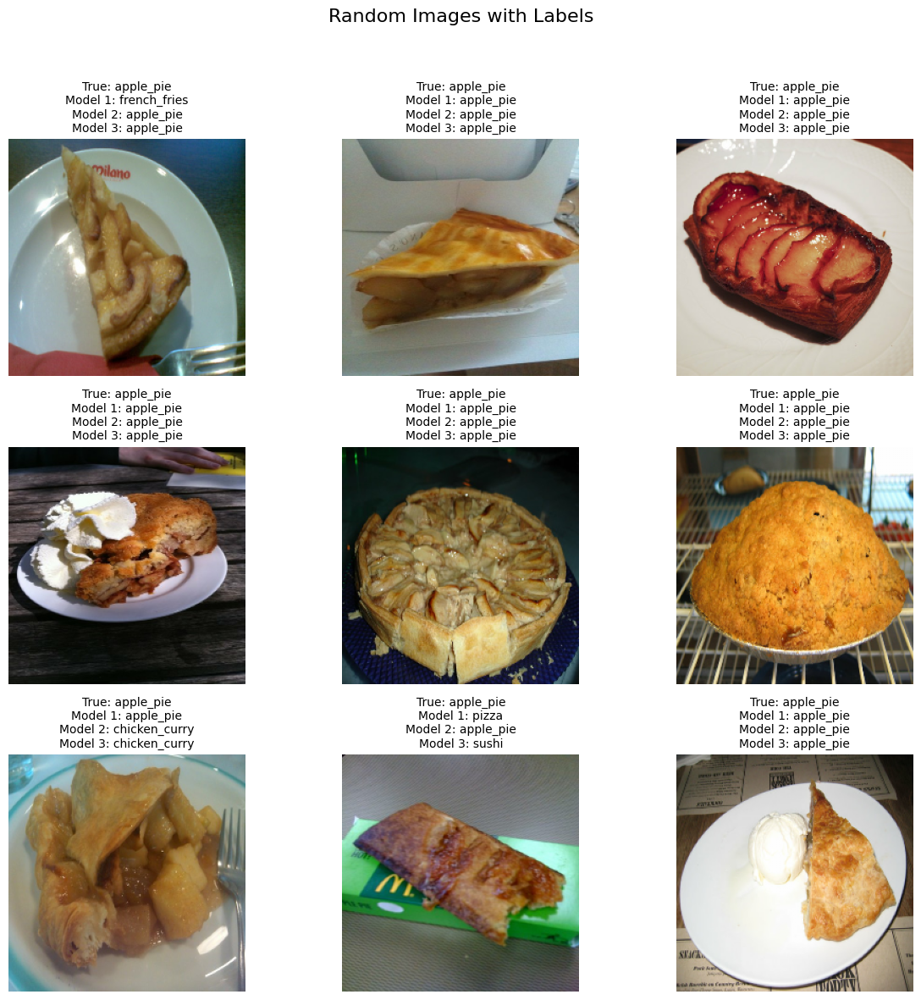

In [18]:
# 7. Plot RandomPLots
model_EfficientNetB2.plot_predictions(test_data, class_names, models=[model_EfficientNetB0, model_EfficientNetB1], num_images= 9)

# Comparing Our Models

In [19]:
%load_ext tensorboard
%tensorboard --logdir TensorBoard/

<IPython.core.display.Javascript object>